In [37]:
%load_ext autoreload
%autoreload 2

import os
import sys
from pathlib import Path
# need to append the path to the cilia package to the sys path
sys.path.append(os.path.abspath(os.path.join(Path.cwd(), '..')))

from Cilia import ParticleTracker
from flurecent_BM_improved import run_simulation
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Test the Code Aikaterina Wrote

In [38]:
# constants
output_dir = str(Path.cwd().parent / 'data/simulation')

FPS = 300 # 1/s
NPP = 100 # nm / pixel
TEMP = 293 # K
visc = 0.001 #Pa s
RADIUS = 250 # nm
LEN = 1000 # frames
SIZE = (100, 100)

In [39]:
# create a video using Aikaterinas code
run_simulation(FPS, NPP, output_dir, viscosity=visc, temperature=TEMP, particle_radius=RADIUS, num_frames=LEN, image_size=SIZE)

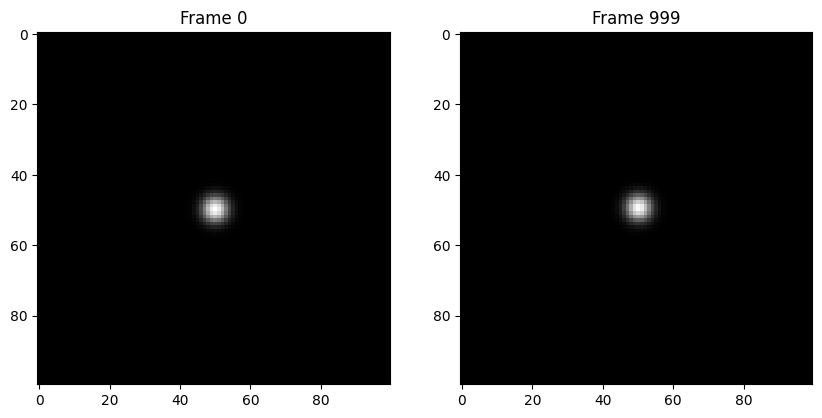

9863


In [40]:
Tracker = ParticleTracker()
Tracker.load(output_dir, '*.tif', FPS).show_frame([0,-1])
print(np.sum(Tracker.frames[0]))

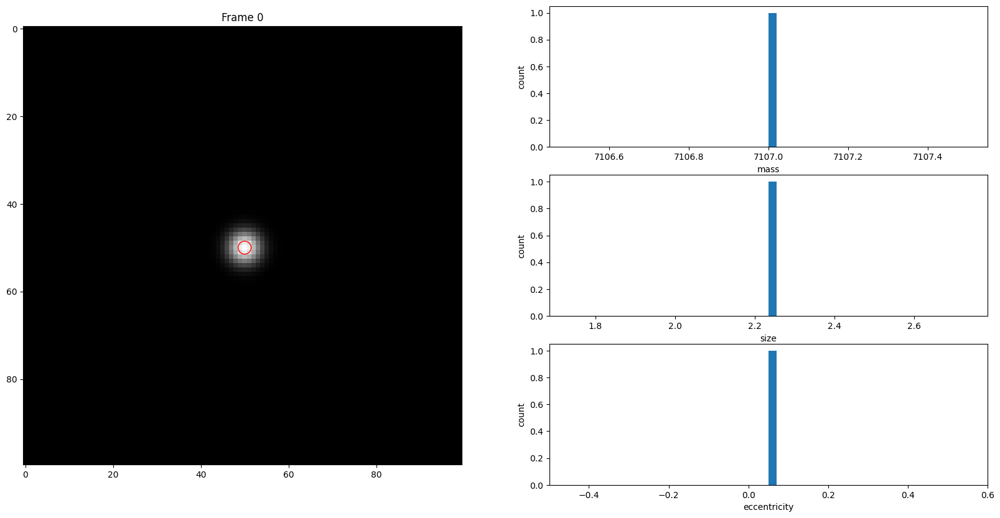

In [41]:
# locate particles in the first frame
diam = np.floor(2*RADIUS/NPP)
if diam % 2 == 0:
    diam += 1
tp_locate_kwargs = {'diameter': diam+4} # add 4 as a buffer

Tracker.locate_in_frame(0, tp_locate_kwargs=tp_locate_kwargs, show=True)

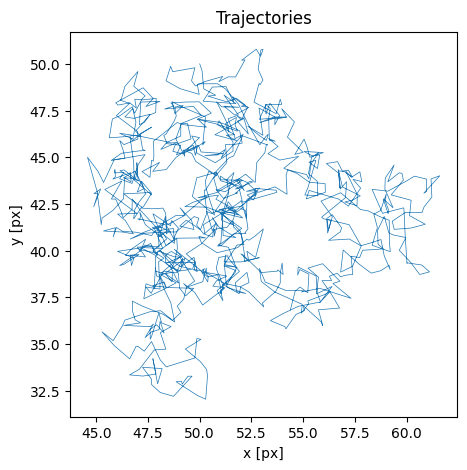

In [42]:
# link the particles between frames
tp_link_kwargs = {'search_range': 10, 'memory': 1}
Tracker.assemble_tracks(tp_locate_kwargs, tp_link_kwargs, 1, show=True)

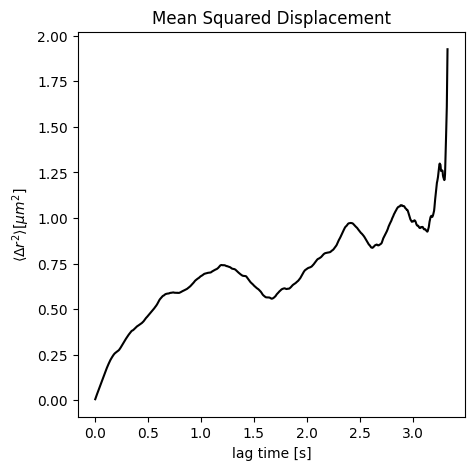

In [43]:
tp_emsd_kwargs = {'mpp': NPP/1e3, 'max_lagtime': len(Tracker)}
Tracker.calculate_msd(tp_emsd_kwargs, show=True)

In [44]:
# Test block to ensure that everything is working
assert Tracker.trajectory['particle'].nunique() == 1, 'More then one Particle detected, the particle may have moved out of bounds'
assert Tracker.trajectory['frame'].nunique() == LEN, 'Not all frames have been detected'

In [45]:
# now compare the tracking results with the ground truth
sim_coords = np.load(output_dir + '/pos_history.npy')
track_coords =Tracker.trajectory[['x', 'y']].to_numpy()

# calculate the difference between the two sets of coordinates
p_to_micron = 1e3/NPP
dxdy = np.linalg.norm(sim_coords - track_coords, axis=1)*p_to_micron
step = np.linalg.norm(sim_coords[1:] - sim_coords[:-1], axis=1)*p_to_micron

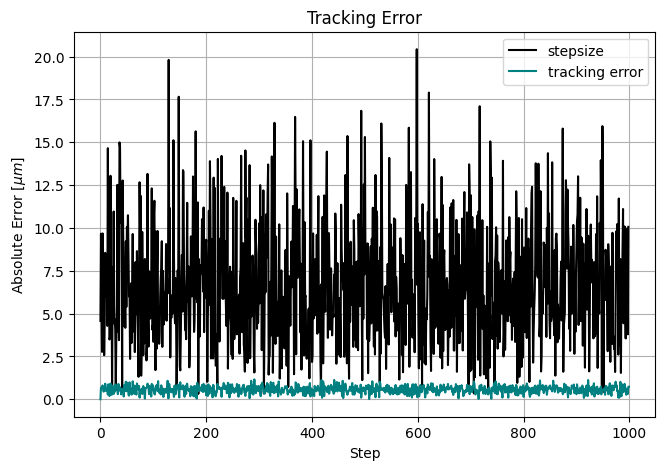

In [46]:
#plot the results
fig, ax = plt.subplots(figsize = (7.5,5))
ax.set_title('Tracking Error')
ax.plot(np.arange((len(step))), step, c='black', label='stepsize')
# ax.plot(np.arange((len(dx))), dx, c='royalblue', label='dx')
# ax.plot(np.arange((len(dy))), dy, c='darkorange', label='dy')
ax.plot(np.arange(len(dxdy)), dxdy, c='teal', label='tracking error')
ax.set(xlabel='Step',ylabel='Absolute Error [$\\mu m$]')
ax.legend(); ax.grid(); plt.show()

In [47]:
# get the min and max values of the coordinates
xmin, xmax = np.min(np.r_[sim_coords, track_coords], axis=0)[0], np.max(np.r_[sim_coords, track_coords], axis=0)[0]
ymin, ymax = np.min(np.r_[sim_coords, track_coords], axis=0)[1], np.max(np.r_[sim_coords, track_coords], axis=0)[1]

# Tracker.crop((xmin, xmax), (ymin, ymax))

# sim_coords -= np.array([xmin, ymin])
# track_coords -= np.array([xmin, ymin])

In [48]:
# create an animation of the tracking results

from matplotlib.animation import FuncAnimation

fig = plt.Figure(figsize=(5, 5))
ax = fig.add_subplot()
im = ax.imshow(Tracker.frames[0], cmap='gray')
sc1 = ax.scatter(sim_coords[0,0], sim_coords[0,1], c='none', edgecolors='r', s=100, marker='.')
sc2 = ax.scatter(track_coords[0,0], track_coords[0,1], c='none', edgecolors='b', s=100, marker='o')

def update(frame):
    ax.set_title(f'frame {frame}')
    im.set_data(Tracker.frames[frame])
    sc1.set_offsets(sim_coords[frame])
    sc2.set_offsets(track_coords[frame])
    return im, sc1, sc2

ani = FuncAnimation(fig, update, frames=LEN, interval=50)
plt.close(fig)
from IPython.display import HTML
HTML(ani.to_jshtml())

### Note
After playing around a bit it became obvious that the Ratio of Error to Stepsize is not constant. I assume that the Error/Stepsize increases when the Stepsize decreases. This is most likely due to the fact that trackpy has an intrinsic error only dependant on the resolution of the image. I want to show that the Absolute Error is dependant on viscosity and the resolution of the Image.

In [49]:
# constants
FPS = 300; TEMP = 293; LEN = 150; SIZE = (75, 75); RADIUS = 250

#create a mesh of NPP and Viscosity values
NPP = np.logspace(2, 3, 2, base=10)
VISC = np.logspace(-3, 1, 1, base=10)

results = pd.DataFrame(0, index = range(len(NPP)*len(VISC)),columns=['NPP', 'VISC', 'mean_dx', 'mean_step'], dtype=float)

for n, npp in enumerate(NPP):
    for v, visc in enumerate(VISC):
        run_simulation(FPS, npp, output_dir, viscosity=visc, temperature=TEMP,
                       particle_radius=RADIUS, num_frames=LEN, image_size=SIZE)
        Tracker = ParticleTracker().load(output_dir, '*.tif', FPS)

        diam = np.floor(2*RADIUS/npp) #prepare tracking
        if diam % 2 == 0:
            diam += 1
        tp_locate_kwargs = {'diameter': diam+4}
        tp_link_kwargs = {'search_range': 10, 'memory': 1}
        Tracker.assemble_tracks(tp_locate_kwargs, tp_link_kwargs, 1)

        # Test block to ensure that everything is working
        assert Tracker.trajectory['particle'].nunique() == 1, f'More then one Particle detected, the particle may have moved out of bounds\nNPP:{npp:.3f}\tVISC:{visc:.3f}'
        assert Tracker.trajectory['frame'].nunique() == LEN, 'Not all frames have been detected'

        # now compare the tracking results with the ground truth
        sim_coords = np.load(output_dir + '/pos_history.npy')
        track_coords =Tracker.trajectory[['x', 'y']].to_numpy()

        # calculate the difference between the two sets of coordinates
        p_to_micron = npp/1e3
        dxdy = np.linalg.norm(sim_coords - track_coords, axis=1)*p_to_micron
        step = np.linalg.norm(sim_coords[1:] - sim_coords[:-1], axis=1)*p_to_micron

        #save the results
        results.loc[n*len(VISC) + v] = [npp, visc, np.mean(dxdy), np.mean(step)]

        print(f'progress: {n*len(VISC) + v + 1}/{len(NPP)*len(VISC)}') # ca. 10-15 sec per iteration

# save the results if needed
#results.to_csv(output_dir + '/results.csv')

progress: 1/2
progress: 2/2


In [50]:
# load in acutal results of a longer simulation
results = pd.read_csv(output_dir + '/results.csv', index_col=0)
NPP = np.logspace(2, 3, 20, base=10)
VISC = np.logspace(-3, 1, 20, base=10)
results.head()

,NPP,VISC,mean_dx,mean_step
0,100.0,0.001000,0.005675,0.068881
1,100.0,0.001624,0.005674,0.051981
2,100.0,0.002637,0.005475,0.041455
3,100.0,0.004281,0.005625,0.032264
4,100.0,0.006952,0.005496,0.025269


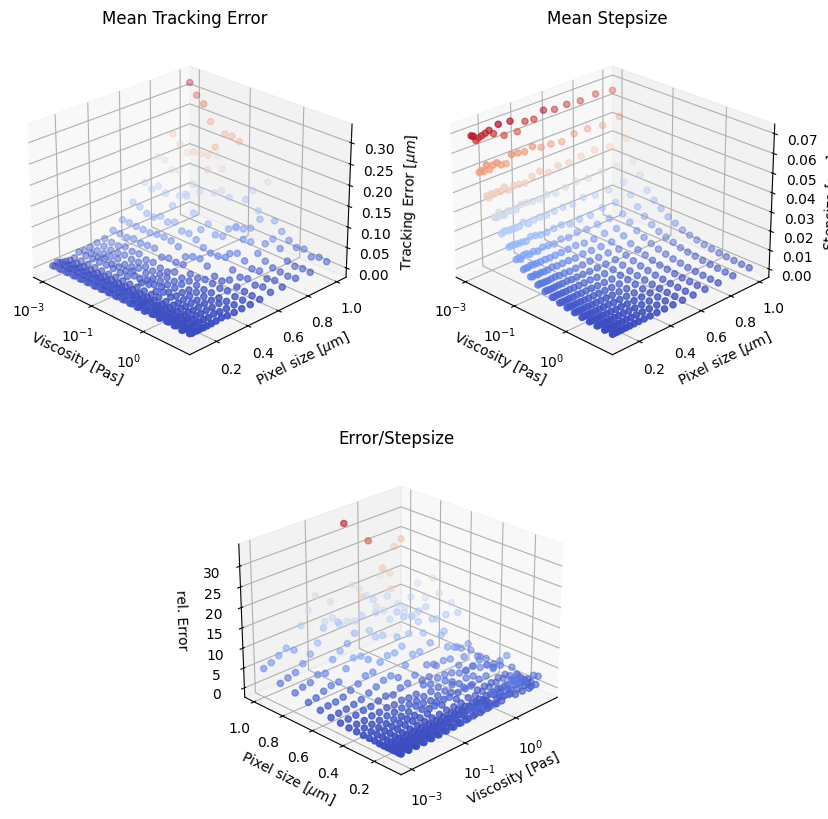

In [51]:
# now create 3d meshgrid plot
import matplotlib.ticker as mticker
from matplotlib import cm

x = results['NPP'].unique()
y = results['VISC'].unique()

z = np.zeros((len(NPP), len(VISC), 3))

for n, npp in enumerate(x):
    for v, visc in enumerate(y):
        z[n, v, 0] = results[(results['NPP'] == npp) & (results['VISC'] == visc)]['mean_dx'].iloc[0]
        z[n, v, 1] = results[(results['NPP'] == npp) & (results['VISC'] == visc)]['mean_step'].iloc[0]
        z[n, v, 2] = z[n, v, 0] / z[n, v, 1]

X, Y = np.meshgrid(y, x)

fig, axs = plt.subplot_mosaic([['a','b'],['c', 'c']], subplot_kw={'projection': '3d'}, figsize=(10, 10))


def log_tick_formatter(val, pos=None):
    return f"$10^{{{int(val)}}}$"

Y /= 1e3 #convert nm to um
X = np.log10(X) #convert to log scale

Z = z[:,:,0]

axs['a'].scatter(X, Y, Z, c=Z, cmap='coolwarm')
axs['a'].set(zlabel='Tracking Error [$\\mu m$]', title='Mean Tracking Error')

Z = z[:,:,1]
axs['b'].scatter(X, Y, Z, c=Z, cmap='coolwarm')
axs['b'].set(zlabel='Stepsize [$\\mu m$]', title='Mean Stepsize')

Z = z[:,:,2]
axs['c'].scatter(X, Y, Z, c=Z, cmap='coolwarm')
axs['c'].set(zlabel='rel. Error ', title='Error/Stepsize')

for ax in axs.values():
    ax.view_init(elev=25, azim=-45)
    ax.xaxis.set_major_formatter(plt.FuncFormatter(log_tick_formatter))
    ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=4))
    ax.set(ylabel='Pixel size [$\\mu$m]', xlabel='Viscosity [Pas]')

axs['c'].view_init(elev=25, azim=225)
plt.show()